# EKF Slam for Known and Unknown Correspondences

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

from matplotlib.animation import FuncAnimation
from util import *

# Mathematical Model of the EKF SLAM Algorithm

The algorithm you provided is part of a Simultaneous Localization and Mapping (SLAM) system, which is used in robotics for navigation and mapping. The core idea is to estimate the state of the robot and the map of the environment simultaneously.

## State Vector and Covariance Matrix

The state vector $ \mu $ is composed of the robot's pose and the positions of the landmarks:

$$
\mu = \begin{bmatrix} \mu_x \\ \mu_{lm_1} \\ \mu_{lm_2} \\ \vdots \\ \mu_{lm_n} \end{bmatrix}
$$

Where:
- $ \mu_x = (\hat{x}, \hat{y}, \hat{\theta})$ is the robot's pose estimate.
- $ \mu_{lm_i} $ is the position estimate of the $ i $-th landmark.

The covariance matrix $ \sigma $ represents the uncertainty in the state estimate:

$$
\sigma = \begin{bmatrix} \sigma_x & \sigma_{x, lm_1} & \sigma_{x, lm_2} & \cdots & \sigma_{x, lm_n} \\ \sigma_{lm_1, x} & \sigma_{lm_1} & \sigma_{lm_1, lm_2} & \cdots & \sigma_{lm_1, lm_n} \\ \sigma_{lm_2, x} & \sigma_{lm_2, lm_1} & \sigma_{lm_2} & \cdots & \sigma_{lm_2, lm_n} \\ \vdots & \vdots & \vdots & \ddots & \vdots \\ \sigma_{lm_n, x} & \sigma_{lm_n, lm_1} & \sigma_{lm_n, lm_2} & \cdots & \sigma_{lm_n} \end{bmatrix}
$$

## Auxiliary Functions
**Note:** The following notation is used below:
- $ I_{N} $ is the identity matrix of size $ N $.
- $ 0_{N \times M} $ is a zero matrix of size $ N \times M) $.

Furthermore the following parameters are defined:
- $dim_{\mu}$ dimension of the pose estimate (in this case 3 for $\mu_x$) 
- $dim_{lm}$ dimension of the pose estimate (in this case 3 for $\mu_{lm_i}
- $n_{lm}$ the number of lanmarks handled by the algorithm (variable for unknown correspondences, or fixed and equal to the total number of landmarks for known correspondences)

To compute the new prediction basedd on the motion model and the incorporation of the sensor measurements the following helper functions were defined, that pre-compute matrices of given dimentions to select and/or manipulate single landmarks or pose estimates and their covariances in the augmented state $\mu, \Sigma$:

1. `f_mat`: This function returns a matrix that extracts the robot's pose from the state vector.

$$
F = \begin{bmatrix} I_{dim_{\mu}} & 0_{dim_{\mu} \times (dim_{lm} \cdot n_{lm})} \end{bmatrix}
$$

2. `f_mat_x`: This function returns a matrix that extracts the state of a specific landmark from the state vector.

$$
F_x = \begin{bmatrix} I_{dim_{\mu}} & 0_{dim_{\mu} \times (correspondence \times dim_{lm})} & 0_{dim_{\mu} \times ((n_{lm} - (correspondence + 1)) \times dim_{lm})} \\ 0_{dim_{lm} \times dim_{\mu}} & 0_{dim_{lm} \times (correspondence \times dim_{lm})} & I_{dim_{lm}} & 0_{dim_{lm} \times ((n_{lm} - (correspondence + 1)) \times dim_{lm})} \end{bmatrix}
$$

3. `h_mat`: This function computes the Jacobian matrix of the measurement model with respect to the state vector.

$$
H = \frac{1}{q} \begin{bmatrix} -r \cdot dx & -r \cdot dy & 0 & r \cdot dx & r \cdot dy & 0 \\ dy & -dx & -q & -dy & dx & 0 \\ 0 & 0 & 0 & 0 & 0 & q \end{bmatrix} \cdot F_x
$$

Where:
- $ q = \max(\epsilon, dx^2 + dy^2) $ which is limited to a value $q \ge \epsilon$ to avoid computational artefacts like the explosion of the innovation covariance $\Psi_k$ and the Mahalanobis distance $\pi_k$
- $ r = \sqrt{q} $

4. `mu_x`: This property returns the robot's pose from the state vector.

$$
\mu_x = \begin{bmatrix}\hat{x} \\ \hat{y} \\ \hat{\theta} \end{bmatrix}
$$

5. `mu_lm`: This function returns the state of a specific landmark from the state vector for a given absolute or self assigned correspondence $c_k$ and a signature $s$.

$$
\mu_{lm, c_k} = \begin{bmatrix}\hat{x}_{lm} \\ \hat{y}_{lm} \\ \hat{s}_{lm}\end{bmatrix}
$$

6. `sigma_x`: This property returns the covariance of the robot's pose, i.e the diagonal block matrix for the row and block slices $[0:dim_{\mu}, 0:dim_{\mu}]$.

$$
\Sigma_x = \Sigma[0:dim_{\mu}, 0:dim_{\mu}]
$$

7. `sigma_lm`: This function returns the covariance of a specific landmark, similar to `sigma_x` but for a given landmark with absolute or self assigned correspondence $c_k$, i.e the diagonal block matrix for the row and block slices $[n_{start,k} : n_{end,k}, n_{start,k} : n_{end,k}]$ with $n_{start,k} = dim_{\mu} + c_k \cdot dim_{lm}$ and $n_{end,k} = dim_{\mu} + (c_k + 1) \cdot dim_{lm}$.

$$
\Sigma_{lm,k} = \Sigma[n_{start,k} : n_{end,k}, n_{start,k} : n_{end,k}]
$$

## Algorithm Steps for Control Input Update

The `predictOdometry` function updates the state estimate and covariance matrix based on the control input $ u $.

### Key Equations

1. **State Update**:
   $$
   \mu_x \larr TF(\mu_x)
   $$

   where $TF$ is the transfer function of the motion model

2. **Control Input Matrix**: the Jacobian of the Control Model's $TF$
   $$
   G = \begin{bmatrix} G & \text{0} \\ \text{0} & I_{dim_{lm} \times n_{lm}} \end{bmatrix}
   $$

3. **Covariance Update**:
   $$
   \Sigma \larr G \cdot \Sigma \cdot G^T + F^T \cdot R \cdot F
   $$

Where:
- $ \mu $ is the state vector.
- $ \Sigma $ is the covariance matrix.
- $ u $ is the control input.
- $ G $ is the matrix that describes the effect of the control input on the state.
- $ F $ is the matrix that extracts the robot's pose from the state vector.
- $ R$ is the covariance matrix of the control input noise.

## Algorithm Steps for Known Correspondences

The `predictKnownCorrespondence` function updates the state estimate and covariance matrix based on the detected landmarks and their correspondences.

### Key Equations

1. **New Landmark Initialization**:
   If $ c_i $ is not in the list of seen landmarks:
   $$
   dx = r_{z_i} \cdot \cos(\phi_{z_i} + \hat{\theta})
   $$
   $$
   dy = r_{z_i} \cdot \sin(\phi_{z_i} + \hat{\theta})
   $$
   $$
   \mu_{lm} = \begin{bmatrix} \hat{x} + dx \\ \hat{y} + dy \\ s_{z_i} \end{bmatrix}= \begin{bmatrix}\hat{x}_{lm} \\ \hat{y}_{lm} \\ \hat{s}_{lm}\end{bmatrix}
   $$

3. **Existing Landmark Update**:
   If $ c_i $ is in the list of seen landmarks:
   $$
   dx = \hat{x}_{lm} - \hat{x}
   $$
   $$
   dy = \hat{y}_{lm} - \hat{y}
   $$

4. **Expected Measurement**:
   $$
   q = \max(\epsilon, dx^2 + dy^2)
   $$
   $$
   r = \sqrt{q}
   $$
   $$
   \phi = \text{arctan2}(\text{dy}, \text{dx}) - \hat{theta}
   $$
   from it the following values can be computed:
   $$
   q = \max(\epsilon, dx^2 + dy^2) \\ \hat{r} = \sqrt{q} \\ \hat{\phi} = \text{atan2}(dy, dx) - \hat{\theta}
   $$ 
   which are then used to compute: 
   $$
   \hat{z} = (\hat{r}, \hat{\phi}, \hat{s})
   $$


4. **Innovation**:
   $$
   \text{dz} = (z - \hat{z})
   $$

5. **Jacobian Matrix**: The Jacobian matrix $ H $ is computed using the function `h_mat`.

7. **Kalman Gain**:
   $$
   K = \Sigma \cdot H^T \cdot (H \cdot \Sigma \cdot H^T + Q)^{-1}
   $$
7. **State Update**:
   $$
   \mu \larr \mu + K \cdot dz
   $$
   $$
   \Sigma \larr (I - K \cdot H) \cdot \Sigma
   $$

Where:
- $ z_i $ is the detected landmark.
- $ c_i $ is the correspondence index.
- $ Q $ is the covariance matrix of the measurement noise.
- $ I $ is the identity matrix of size $ dim_{\mu} + dim_{lm} \times n_{lm} $.

This function is used to update the state estimate and covariance matrix based on the detected landmarks and their known correspondences. The algorithm uses the Kalman filter framework to update the state estimate and covariance matrix.

## Algorithm Steps for Unknwon Correspondences
The `predictUnnownCorrespondence` function updates the state estimate and covariance matrix based on the detected landmarks when the correspondences are not knonw.

1. **New Landmark Hypothesis**: Consider the possibility that the detected landmark $ z_i $ is a new landmark not previously observed. Calculate the expected measurements $ \hat{z} $.

2. **Initialization**: For each detected landmark $ z_i $, initialize variables under the _New Landmark Hypothesis_:
   - $ \pi_{\text{min}} $ the Mahalanobis distance for the initial hypothesis set to the gate threshold
   - $ c_{\text{min}} $ the correspondence of the landmark with the smalles Mahalanobis distance initialized to $N+1$ where $N$ is the number of known landmarks.
   - $ H_{\text{min}}$ the Jacobian matrix for the new landmark hypothesis.
   - $ dz_{\text{min}} $ the innovation vector for the new landmark hypothesis.
   - $ \Psi_{\text{min}} $ the innovation covariance for the new landmark hypothesis.

4. **Existing Landmarks**: For each existing landmark $ c_k $, compute the expected measurements and the corresponding Jacobian matrix. Calculate the innovation $ \text{dz}_k $ and the innovation covariance $ \psi_{\text{mat},k} $.

5. **Mahalanobis Distance**: Compute the Mahalanobis distance $ \pi_k $ for each existing landmark.

6. **Minimization of $\pi_k$**: Extract the landmark with the smallest Mahalanobis distance s.t. $\pi_{\text{min}} = \pi_k$ for $\pi_k \le \pi_{\text{min}}$ and update the auxiliary variables accordingly.

6. **Update State**: After checking all existing landmarks, update the state vector $ \mu $ and the state covariance matrix $ \sigma $ using the Kalman gain $ K $.

7. **Landmark Management**: Update the number of landmarks $ n_{\text{lm}} $ and the list of seen landmarks if a new landmark is detected.

### Key Calculations

1. **Expected Measurements**: for a landmark the expected measurement $\hat{z}$ is copmputed as follows:
   - For a new landmark hypothesis:
     $$
     dx = r{z_i} \cdot \cos(\phi_{z_i} + \hat{\theta}) \\
     dy = r{z_i} \cdot \sin(\phi_{z_i} + \hat{\theta}) \\
     \hat{s} = s_{z_i}
     $$
   - For a landmark previously observed:
     $$
     dx = \hat{x}_{lm} - \hat{x} \\
     dy = \hat{y}_{lm} - \hat{y} \\
     \hat{s} = \hat{s}_{lm}
     $$

   from it the following values can be computed:
   $$
   q = \max(\epsilon, dx^2 + dy^2) \\ \hat{r} = \sqrt{q} \\ \hat{\phi} = \text{atan2}(dy, dx) - \hat{\theta}
   $$ 
   which are then used to compute: 
   $$
   \hat{z} = (\hat{r}, \hat{\phi}, \hat{s})
   $$

2. **Jacobian Matrix**: The Jacobian matrix $ H $ is computed using the function `h_mat`.

3. **Innovation**:
   $$
   \text{dz} = (z - \hat{z})
   $$

4. **Innovation Covariance**:
   $$
   \Psi_{\text{min}} = H_{\text{min}} \cdot \Sigma \cdot H_{\text{min}}^T + Q
   $$
   where $Q$ is the covariance matrix of the measurement noise.

5. **Mahalanobis Distance**:
   $$
   \pi_k = dz_{\text{min}}^T \cdot \Psi_{\text{min}}^{-1} \cdot dz_{\text{min}}
   $$

6. **Kalman Gain**:
   $$
   K = \Sigma \cdot H_{\text{min}}^T \cdot \Psi_{\text{min}}^{-1}
   $$

7. **State Update**:
   $$
   \mu \larr \mu + K \cdot dz_{\text{min}}
   $$
   $$
   \Sigma \larr (I - K \cdot H_{\text{min}}) \cdot \Sigma
   $$

This algorithm is part of a SLAM system where the robot maps its environment and localizes itself within that map. The detected landmarks are features in the environment that the robot uses to update its belief about its position and the map of the environment. The algorithm uses the Kalman filter framework to update the state estimate and covariance matrix based on the detected landmarks. The Mahalanobis distance is used to determine the best match between the detected landmark and the existing map features.


## Initialize Map

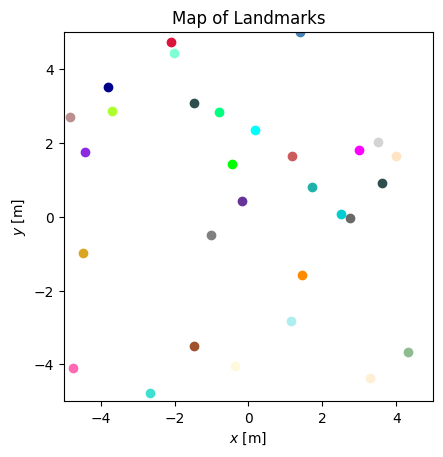

In [2]:
# create map
n_landmarks = 30

x_roi = (-5, 5)
y_roi = (-5, 5)

landmarks = []
for signature in range(n_landmarks):
    #sample coordinates in roi
    x = np.random.uniform(x_roi[0], x_roi[1])
    y = np.random.uniform(y_roi[0], y_roi[1])
    phi = Angle.from_radians(np.random.uniform(0, 2 * np.pi))
    #create landmark
    landmarks.append(Landmark(Pose(x, y, phi), signature))

# landmarks.append(Landmark(Pose(2, 0, Angle(0)), 0))
# landmarks.append(Landmark(Pose(3, -1, Angle(30)), 1))
# landmarks.append(Landmark(Pose(3, 1, Angle(-30)), 2))

landmark_map = LandmarkMap(landmarks)

#plot map
f, ax = plt.subplots()

ax.set_xlim(x_roi)
ax.set_ylim(y_roi)
ax.set_title("Map of Landmarks")
ax.set_xlabel("$x$ [m]")
ax.set_ylabel("$y$ [m]")
ax.set_aspect('equal', adjustable='box')

landmark_map.draw(ax)

## Initialize the Robot and Sensor

In [3]:
#robot's initial position
robot_pose  = Pose(0, 0, Angle(0))
sensor_pose = Pose(0.5, 0, Angle(0))
th_fov = Angle(60) #[°]
sensor_range = 5 #[m]

#define robot's sensor
sensors = [
    CameraSensor(sensor_pose, th_fov, robot_pose=robot_pose, range=sensor_range)
]

robot = Robot(robot_pose, sensors, landmark_map)

# Aux funcs for init and reset at block begin
def resetRobot():
    robot.updatePosition(robot_pose)

def initializeEkf(unknown_correspondences: bool = False, q_mat = np.eye(3), r_mat = np.eye(3)):
    n_lm = len(landmark_map.landmarks) if not unknown_correspondences else 0
    
    return EkfSlam(robot.pos.as_array, np.eye(Pose.dim()), n_landmarks=n_lm, q_mat=q_mat, r_mat=r_mat)

## Initialize the sample Control Input

In [4]:
dt = 1 #[s]
angular_velocity = 1 #[rad/s]
linear_velocity = 1 #[m/s]

u = VelocityControl(linear_velocity, angular_velocity, dt)

## Test and Compare Algorithms
### EKF Slam for Known Correspondences
In this section the EKF Slam algorithm behaviour is shown in difference scenarios. First the two prediciton steps are illustrated and then three animation show the performance of the EKF Slam without tuning of the hyper parameters when confornteed with:
- No motion noise nor detection noise
- Motion nosie, but no detection noise
- Motion noise in combination with detection noise

#### Visualization of the Prediction Steps

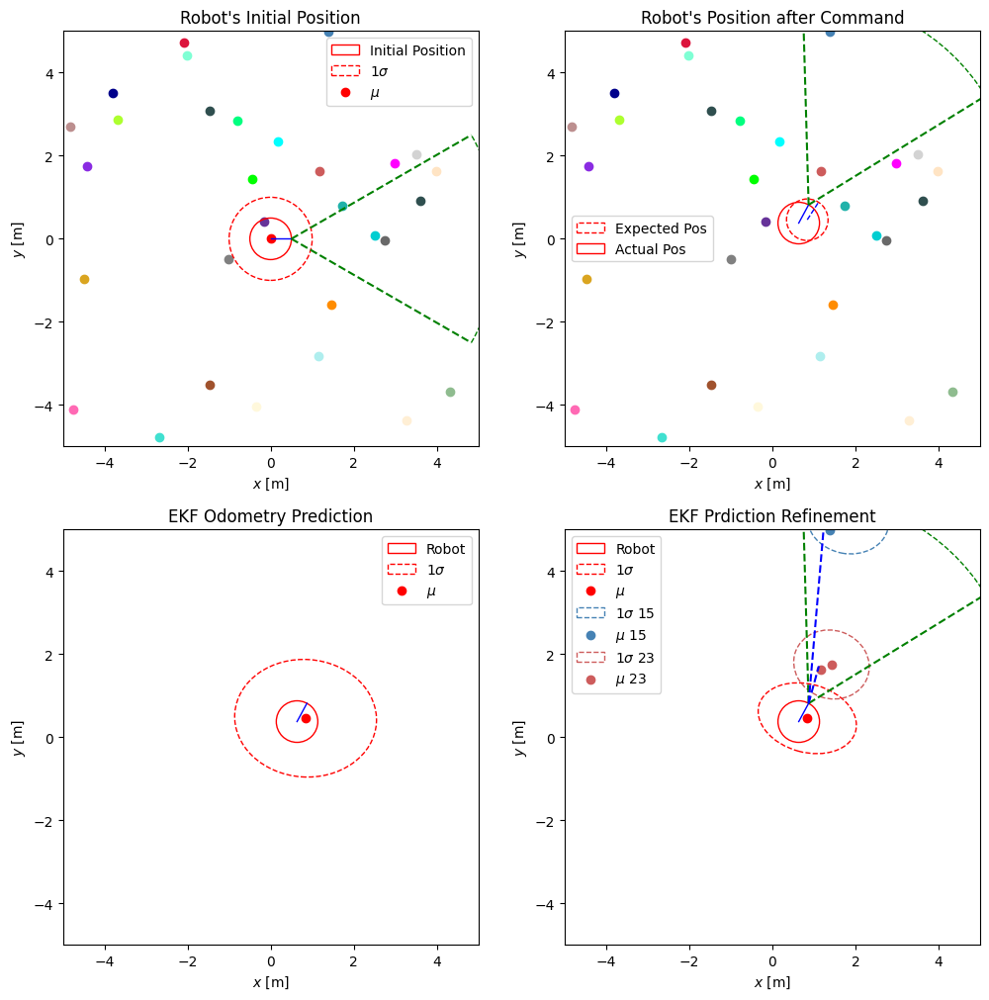

In [5]:
resetRobot()
ekf = initializeEkf()

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))
### --- AX1
ax1.set_title("Robot's Initial Position")
ax1.set_xlim(x_roi)
ax1.set_ylim(y_roi)
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")

landmark_map.draw(ax1)
robot.draw(ax1, label="Initial Position")
ekf.draw(ax1, n_sigmas=1)

### --- AX2
ax2.set_title("Robot's Position after Command")
ax2.set_xlim(x_roi)
ax2.set_ylim(y_roi)
ax2.set_xlabel("$x$ [m]")
ax2.set_ylabel("$y$ [m]")

landmark_map.draw(ax2)

robot.applyControl(u, motion_noise=False)
robot.draw(ax2, label="Expected Pos", linestyle='--', draw_sensor=False)

resetRobot()

robot.applyControl(u)
robot.draw(ax2, label="Actual Pos")
### --- AX3
ax3.set_title("EKF Odometry Prediction")
ax3.set_xlim(x_roi)
ax3.set_ylim(y_roi)
ax3.set_xlabel("$x$ [m]")
ax3.set_ylabel("$y$ [m]")

ekf.predictOdometry(u)
robot.draw(ax3, label="Robot", draw_sensor=False)
ekf.draw(ax3, n_sigmas=1)

### --- AX4
ax4.set_title("EKF Prdiction Refinement")
ax4.set_xlim(x_roi)
ax4.set_ylim(y_roi)
ax4.set_xlabel("$x$ [m]")
ax4.set_ylabel("$y$ [m]")

sensor_readings = robot.getSensorReadings(detection_noise=True, std_meas_noise=0.1) 
deteced_features = sensor_readings[0][0]
correspondences = sensor_readings[0][1]

ekf.predictKnownCorrespondence(deteced_features, correspondences)

landmark_map.draw(ax4, correspondences)
robot.draw(ax4, label="Robot", draw_sensor_readings=True)
ekf.draw(ax4, n_sigmas=1, landmark_map=landmark_map)


#### EKF Slam in Noiseless Conditions

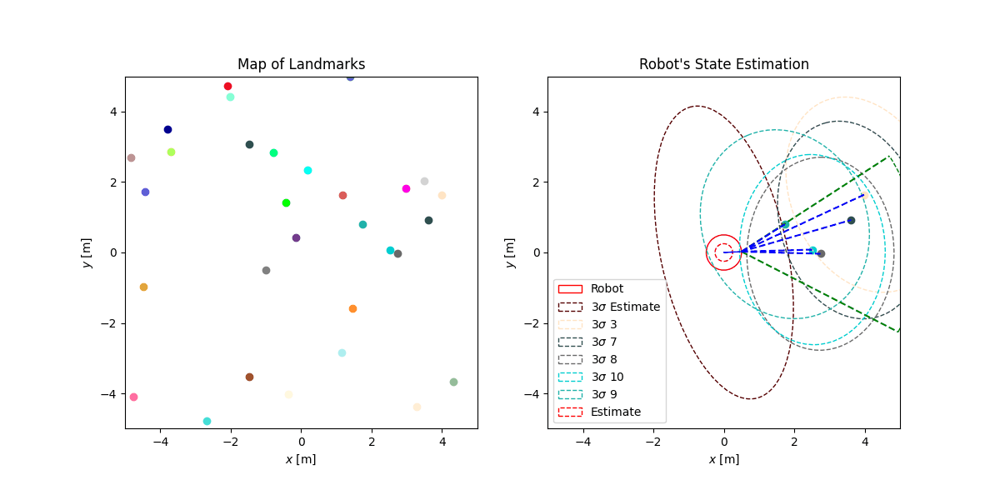

In [6]:
resetRobot()
ekf = initializeEkf()

dt = 0.05
animation_time = 5 #[s]

n_frames = int(animation_time / dt)
trajectory = generateRandomVelocityTrajectory(n_frames,dt)
applied_controls = []

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

landmark_map.draw(ax1)
ax1.set_aspect('equal', adjustable='box')
ax1.set_title("Map of Landmarks")
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")
#update function for animation
def update(frame):
    global applied_controls
    ax2.clear()
    
    u = trajectory[frame]

    applied_controls.append(robot.applyControl(u, motion_noise=False))

    sensor_readings = robot.getSensorReadings(detection_noise=False, std_meas_noise=0.1) 
    deteced_features = sensor_readings[0][0]
    correspondences = sensor_readings[0][1]

    ekf.predictOdometry(u)  
    ekf.predictKnownCorrespondence(deteced_features, correspondences)

    ax1.set_xlim(x_roi)
    ax1.set_ylim(y_roi)

    ax2.set_xlim(x_roi)
    ax2.set_ylim(y_roi)
    ax2.set_title("Robot's State Estimation")
    ax2.set_xlabel("$x$ [m]")
    ax2.set_ylabel("$y$ [m]")

    landmark_map.draw(ax2, correspondences=correspondences)
    robot.draw(ax2, label = "Robot", draw_sensor_readings=True)
    ekf.draw(ax2, n_sigmas=3, label = "Estimate",  draw_all_sigma=False, draw_mu=False, landmark_map=landmark_map)
    
    pos = robot.pos
    robot.updatePosition(ekf.mu_x)
    robot.draw(ax2, label = "Estimate", linestyle='--', draw_sensor=False, r=0.25)
    robot.updatePosition(pos)

ani = FuncAnimation(fig, update, frames=np.arange(0, n_frames), interval=50)

gif_path = 'img/6/knownCorr.gif'
ani.save(gif_path, writer='pillow', fps=20)

plt.close(fig)

display(Image(filename=gif_path))

#### EKF Slam with Motion Noise

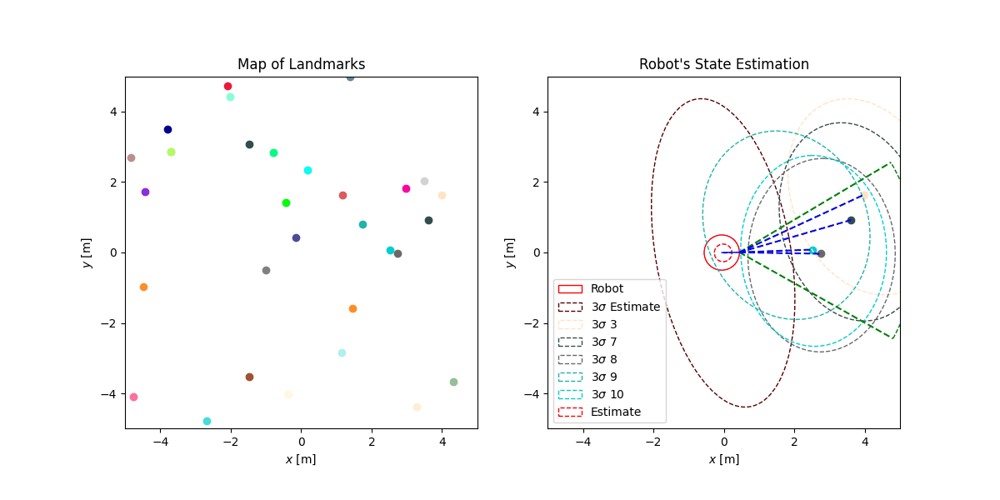

In [7]:
resetRobot()
ekf = initializeEkf()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

landmark_map.draw(ax1)
ax1.set_aspect('equal', adjustable='box')
ax1.set_title("Map of Landmarks")
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")
#update function for animation
def update(frame):
    global applied_controls
    ax2.clear()
    
    u = trajectory[frame]

    applied_controls.append(robot.applyControl(u, motion_noise=True))

    sensor_readings = robot.getSensorReadings(detection_noise=False, std_meas_noise=0.1) 
    deteced_features = sensor_readings[0][0]
    correspondences = sensor_readings[0][1]

    ekf.predictOdometry(u)  
    ekf.predictKnownCorrespondence(deteced_features, correspondences)

    ax1.set_xlim(x_roi)
    ax1.set_ylim(y_roi)

    ax2.set_xlim(x_roi)
    ax2.set_ylim(y_roi)
    ax2.set_title("Robot's State Estimation")
    ax2.set_xlabel("$x$ [m]")
    ax2.set_ylabel("$y$ [m]")

    landmark_map.draw(ax2, correspondences=correspondences)
    robot.draw(ax2, label = "Robot", draw_sensor_readings=True)
    ekf.draw(ax2, n_sigmas=3, label = "Estimate",  draw_all_sigma=False, draw_mu=False, landmark_map=landmark_map)
    
    pos = robot.pos
    robot.updatePosition(ekf.mu_x)
    robot.draw(ax2, label = "Estimate", linestyle='--', draw_sensor=False, r=0.25)
    robot.updatePosition(pos)

ani = FuncAnimation(fig, update, frames=np.arange(0, n_frames), interval=50)

gif_path = 'img/6/knownCorrMotionNoise.gif'
ani.save(gif_path, writer='pillow', fps=20)

plt.close(fig)

display(Image(filename=gif_path))

#### EKF Slam with Motion and Detection Noise

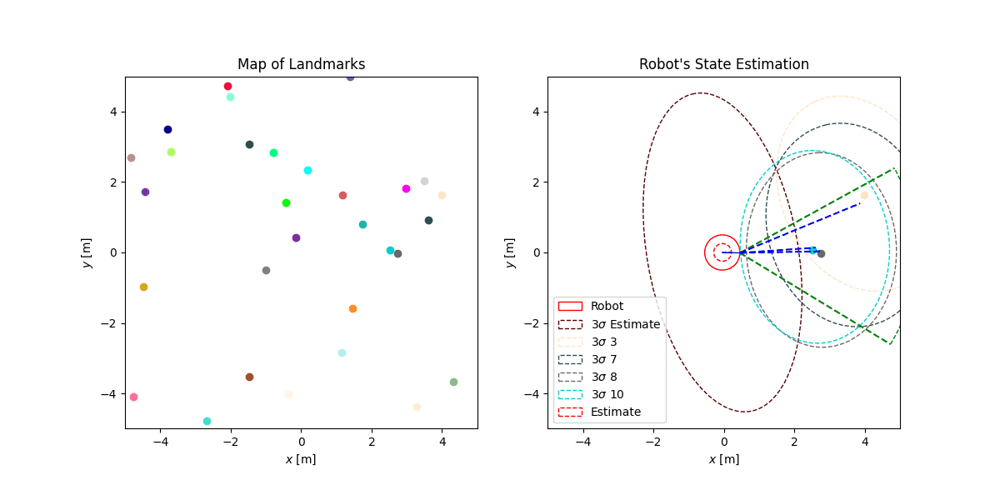

In [8]:
resetRobot()
ekf = initializeEkf()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

landmark_map.draw(ax1)
ax1.set_aspect('equal', adjustable='box')
ax1.set_title("Map of Landmarks")
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")
#update function for animation
def update(frame):
    global applied_controls
    ax2.clear()
    
    u = trajectory[frame]

    applied_controls.append(robot.applyControl(u, motion_noise=True))

    sensor_readings = robot.getSensorReadings(detection_noise=True, std_meas_noise=0.1) 
    deteced_features = sensor_readings[0][0]
    correspondences = sensor_readings[0][1]

    ekf.predictOdometry(u)  
    ekf.predictKnownCorrespondence(deteced_features, correspondences)

    ax1.set_xlim(x_roi)
    ax1.set_ylim(y_roi)

    ax2.set_xlim(x_roi)
    ax2.set_ylim(y_roi)
    ax2.set_title("Robot's State Estimation")
    ax2.set_xlabel("$x$ [m]")
    ax2.set_ylabel("$y$ [m]")

    landmark_map.draw(ax2, correspondences=correspondences)
    robot.draw(ax2, label = "Robot", draw_sensor_readings=True)
    ekf.draw(ax2, n_sigmas=3, label = "Estimate",  draw_all_sigma=False, draw_mu=False, landmark_map=landmark_map)
    
    pos = robot.pos
    robot.updatePosition(ekf.mu_x)
    robot.draw(ax2, label = "Estimate", linestyle='--', draw_sensor=False, r=0.25)
    robot.updatePosition(pos)

ani = FuncAnimation(fig, update, frames=np.arange(0, n_frames), interval=50)

gif_path = 'img/6/knownCorrNoisy.gif'
ani.save(gif_path, writer='pillow', fps=20)

plt.close(fig)

display(Image(filename=gif_path))

### EKF Slam for Unknown Correspondences
In this section the EKF Slam algorithm behaviour is shown in difference scenarios when the correspondences are not known. First the two prediciton steps are illustrated and then three animation show the performance of the EKF Slam without tuning of the hyper parameters when confornteed with:
- No motion noise nor detection noise
- Motion nosie, but no detection noise
- Motion noise in combination with detection noise

#### Visualization of the Prediction Steps

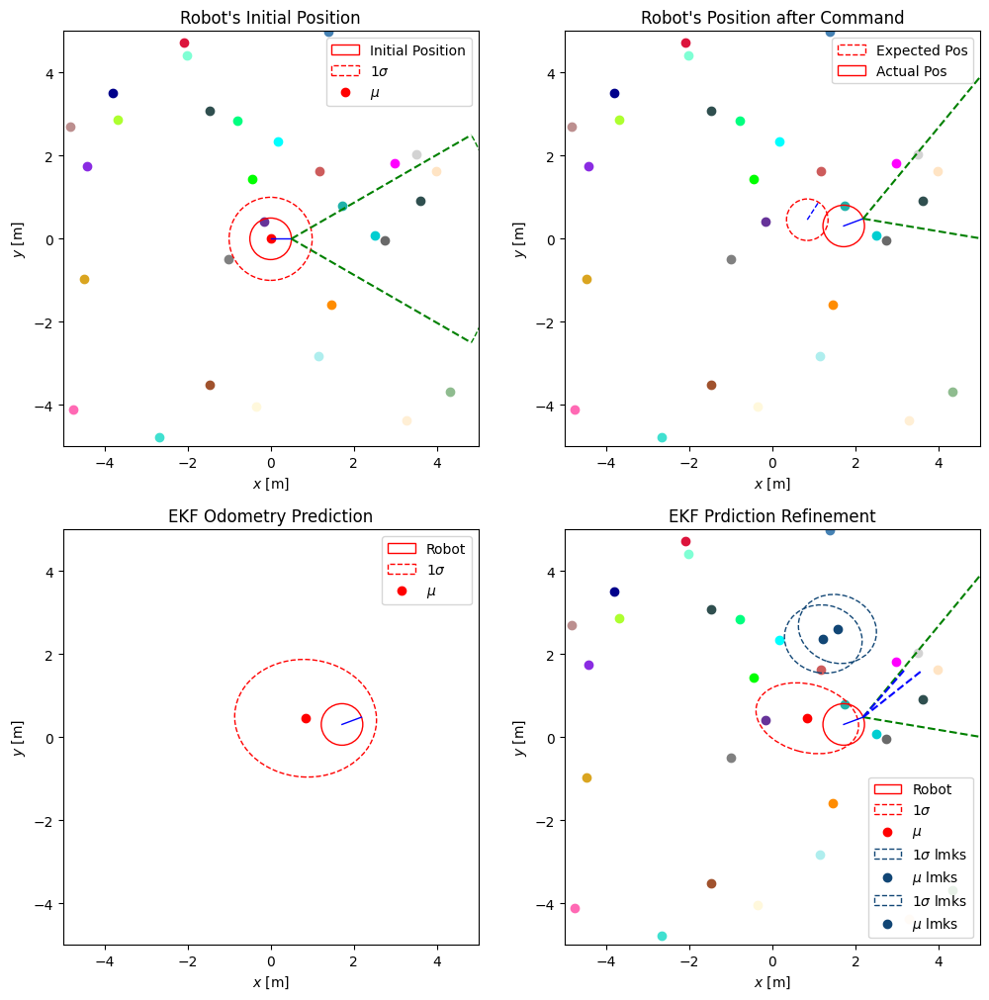

In [9]:
resetRobot()
ekf = initializeEkf(unknown_correspondences=True)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 12))
### --- AX1
ax1.set_title("Robot's Initial Position")
ax1.set_xlim(x_roi)
ax1.set_ylim(y_roi)
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")

landmark_map.draw(ax1)
robot.draw(ax1, label="Initial Position")
ekf.draw(ax1, n_sigmas=1)

### --- AX2
ax2.set_title("Robot's Position after Command")
ax2.set_xlim(x_roi)
ax2.set_ylim(y_roi)
ax2.set_xlabel("$x$ [m]")
ax2.set_ylabel("$y$ [m]")

landmark_map.draw(ax2)

robot.applyControl(u, motion_noise=False)
robot.draw(ax2, label="Expected Pos", linestyle='--', draw_sensor=False)

resetRobot()

robot.applyControl(u, motion_noise=True)
robot.draw(ax2, label="Actual Pos")
### --- AX3
ax3.set_title("EKF Odometry Prediction")
ax3.set_xlim(x_roi)
ax3.set_ylim(y_roi)
ax3.set_xlabel("$x$ [m]")
ax3.set_ylabel("$y$ [m]")

ekf.predictOdometry(u)
robot.draw(ax3, label="Robot", draw_sensor=False)
ekf.draw(ax3, n_sigmas=1)

### --- AX4
ax4.set_title("EKF Prdiction Refinement")
ax4.set_xlim(x_roi)
ax4.set_ylim(y_roi)
ax4.set_xlabel("$x$ [m]")
ax4.set_ylabel("$y$ [m]")

sensor_readings = robot.getSensorReadings(detection_noise=True) 
deteced_features = sensor_readings[0][0]
correspondences = sensor_readings[0][1]

ekf.predictUnknownCorrespondence(deteced_features)

landmark_map.draw(ax4)
robot.draw(ax4, label="Robot", draw_sensor_readings=True)
ekf.draw(ax4, n_sigmas=1)


#### EKF Slam in Noiseless Conditions

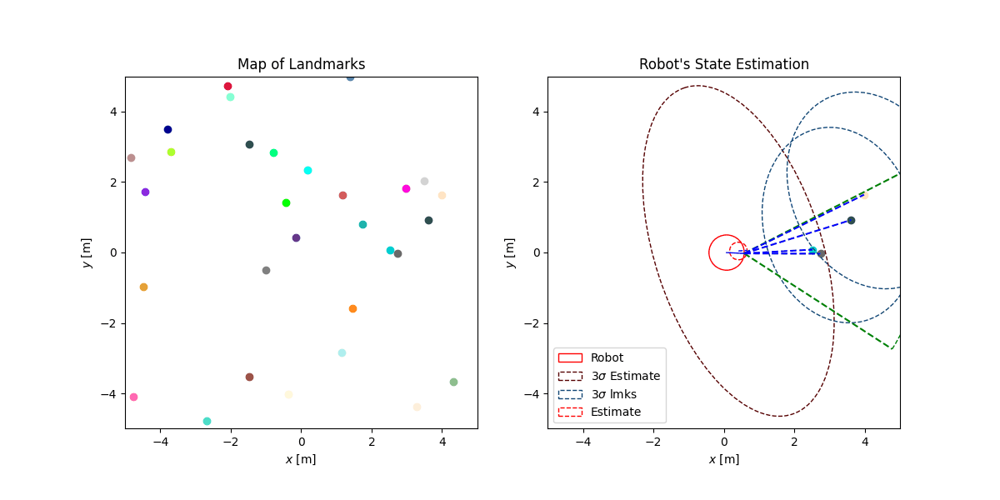

In [10]:
resetRobot()
ekf = initializeEkf(unknown_correspondences=True)

dt = 0.05
animation_time = 5 #[s]

n_frames = int(animation_time / dt)
trajectory = generateRandomVelocityTrajectory(n_frames,dt)
applied_controls = []

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

landmark_map.draw(ax1)
ax1.set_aspect('equal', adjustable='box')
ax1.set_title("Map of Landmarks")
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")
#update function for animation
def update(frame):
    global applied_controls
    ax2.clear()
    
    u = trajectory[frame]

    applied_controls.append(robot.applyControl(u, motion_noise=False))

    sensor_readings = robot.getSensorReadings(detection_noise=False, std_meas_noise=0.1) 
    deteced_features = sensor_readings[0][0]
    correspondences = sensor_readings[0][1]

    ekf.predictOdometry(u)  
    ekf.predictUnknownCorrespondence(deteced_features)

    ax1.set_xlim(x_roi)
    ax1.set_ylim(y_roi)

    ax2.set_xlim(x_roi)
    ax2.set_ylim(y_roi)
    ax2.set_title("Robot's State Estimation")
    ax2.set_xlabel("$x$ [m]")
    ax2.set_ylabel("$y$ [m]")

    landmark_map.draw(ax2, correspondences=correspondences)
    robot.draw(ax2, label = "Robot", draw_sensor_readings=True)
    ekf.draw(ax2, n_sigmas=3, label = "Estimate",  draw_all_sigma=False, draw_mu=False)
    
    pos = robot.pos
    robot.updatePosition(ekf.mu_x)
    robot.draw(ax2, label = "Estimate", linestyle='--', draw_sensor=False, r=0.25)
    robot.updatePosition(pos)

ani = FuncAnimation(fig, update, frames=np.arange(0, n_frames), interval=50)

gif_path = 'img/6/unknownCorr.gif'
ani.save(gif_path, writer='pillow', fps=20)

plt.close(fig)

display(Image(filename=gif_path))

#### EKF Slam with Motion Noise

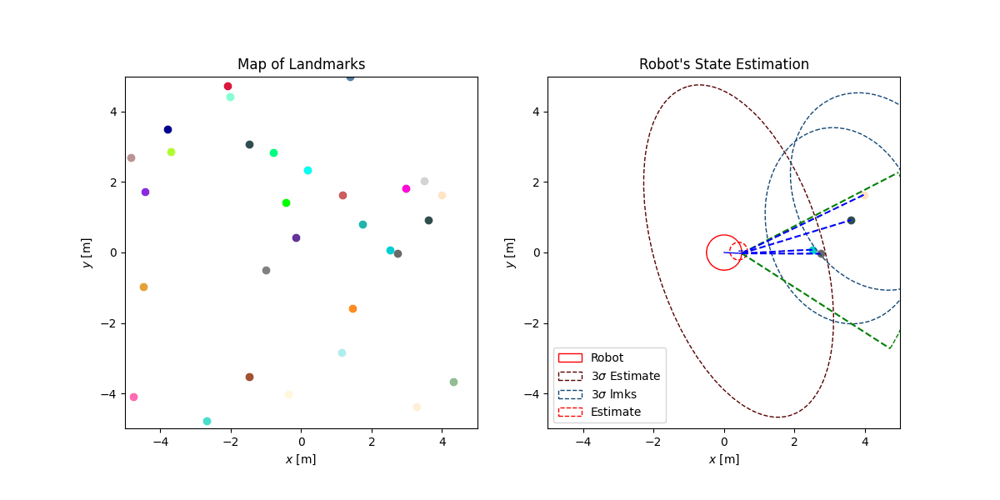

In [11]:
resetRobot()
ekf = initializeEkf(unknown_correspondences=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

landmark_map.draw(ax1)
ax1.set_aspect('equal', adjustable='box')
ax1.set_title("Map of Landmarks")
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")
#update function for animation
def update(frame):
    global applied_controls
    ax2.clear()
    
    u = trajectory[frame]

    applied_controls.append(robot.applyControl(u, motion_noise=True))

    sensor_readings = robot.getSensorReadings(detection_noise=False, std_meas_noise=0.1) 
    deteced_features = sensor_readings[0][0]
    correspondences = sensor_readings[0][1]

    ekf.predictOdometry(u)  
    ekf.predictUnknownCorrespondence(deteced_features)

    ax1.set_xlim(x_roi)
    ax1.set_ylim(y_roi)

    ax2.set_xlim(x_roi)
    ax2.set_ylim(y_roi)
    ax2.set_title("Robot's State Estimation")
    ax2.set_xlabel("$x$ [m]")
    ax2.set_ylabel("$y$ [m]")

    landmark_map.draw(ax2, correspondences=correspondences)
    robot.draw(ax2, label = "Robot", draw_sensor_readings=True)
    ekf.draw(ax2, n_sigmas=3, label = "Estimate",  draw_all_sigma=False, draw_mu=False)
    
    pos = robot.pos
    robot.updatePosition(ekf.mu_x)
    robot.draw(ax2, label = "Estimate", linestyle='--', draw_sensor=False, r=0.25)
    robot.updatePosition(pos)

ani = FuncAnimation(fig, update, frames=np.arange(0, n_frames), interval=50)

gif_path = 'img/6/unknownCorrMotionNoise.gif'
ani.save(gif_path, writer='pillow', fps=20)

plt.close(fig)

display(Image(filename=gif_path))

#### EKF Slam with Motion and Detection Noise

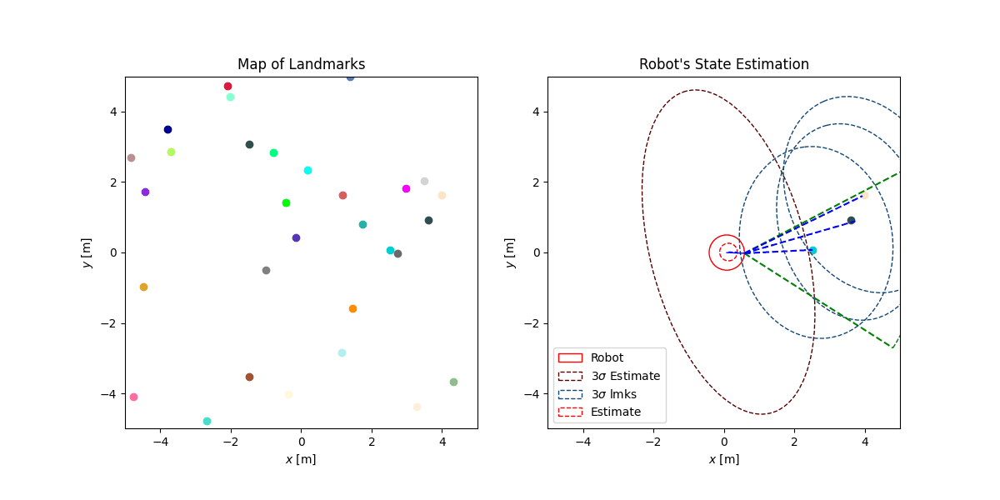

In [12]:
resetRobot()
ekf = initializeEkf(unknown_correspondences=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

landmark_map.draw(ax1)
ax1.set_aspect('equal', adjustable='box')
ax1.set_title("Map of Landmarks")
ax1.set_xlabel("$x$ [m]")
ax1.set_ylabel("$y$ [m]")
#update function for animation
def update(frame):
    global applied_controls
    ax2.clear()
    
    u = trajectory[frame]

    applied_controls.append(robot.applyControl(u, motion_noise=True))

    sensor_readings = robot.getSensorReadings(detection_noise=True, std_meas_noise=0.1) 
    deteced_features = sensor_readings[0][0]
    correspondences = sensor_readings[0][1]

    ekf.predictOdometry(u)  
    ekf.predictUnknownCorrespondence(deteced_features)

    ax1.set_xlim(x_roi)
    ax1.set_ylim(y_roi)

    ax2.set_xlim(x_roi)
    ax2.set_ylim(y_roi)
    ax2.set_title("Robot's State Estimation")
    ax2.set_xlabel("$x$ [m]")
    ax2.set_ylabel("$y$ [m]")

    landmark_map.draw(ax2, correspondences=correspondences)
    robot.draw(ax2, label = "Robot", draw_sensor_readings=True)
    ekf.draw(ax2, n_sigmas=3, label = "Estimate",  draw_all_sigma=False, draw_mu=False)
    
    pos = robot.pos
    robot.updatePosition(ekf.mu_x)
    robot.draw(ax2, label = "Estimate", linestyle='--', draw_sensor=False, r=0.25)
    robot.updatePosition(pos)

ani = FuncAnimation(fig, update, frames=np.arange(0, n_frames), interval=50)

gif_path = 'img/6/unknownCorrNoisy.gif'
ani.save(gif_path, writer='pillow', fps=20)

plt.close(fig)

display(Image(filename=gif_path))